In [53]:
from matplotlib import style
from matplotlib.animation import FuncAnimation
from IPython import display
import nm_lib as nm
style.use('dark_background')
import importlib
importlib.reload(nm)

<module 'nm_lib' from '/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/nm_lib.py'>

# Operator splitting 

## 1- OS precision

Solve the following Burgers' equation: 

$$\frac{\partial u}{\partial t} = - a \frac{\partial u}{\partial x} - b \frac{\partial u}{\partial x}   \tag{1}$$

following exersize [2b](https://github.com/AST-Course/AST5110/blob/main/ex_2b.ipynb). where $x[x_0, x_f]$ with $x_0 = −2.6$, $x_f = 2.6$, $a=-0.7$ and $b=-0.3$, periodic boundary conditions and with initial condition:

$$u(x,t=t_0) = \cos^2 \left(\frac{6 \pi x}{5} \right) / \cosh(5x^2)  \tag{2}$$

Solve the evolution for the following four different approaches: 

- 1 With additive OS.  

- 2 With Lie-Trotter OS. 

- 3 With Strang OS.

- 4 Without an operator splitting and single time-step method but add the to terms: 

$$\frac{\partial u}{\partial t} = - (a+b) \frac{\partial u}{\partial x}$$

for $nump=256$ and 100 steps.

_Suggestion_: use the Lax-method scheme for all cases with `deriv_cent`. Make sure the boundaries are properly selected.

Fill in the function `osp_LL_Add`, `osp_LL_Lie`, and `osp_LL_Strang`.

Start with $cfl\_cut = 0.4$ and increase up to $0.9$.  

Which OS schemes are stable? Which one is more diffusive? Why?

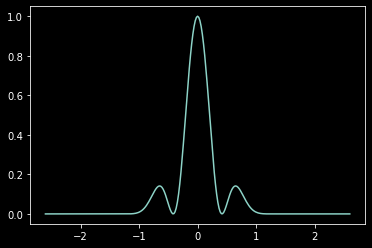

In [54]:
import numpy as np
import matplotlib.pyplot as plt

x0 = -2.6
xf = 2.6
nump = 256

def u_x_t0(xx):
    return np.ma.cos(0.2*6*np.pi*xx)**2/np.cosh(5*xx*xx)

xx = np.linspace(x0,xf,nump+1)
ux_t0 = u_x_t0(xx)

plt.plot(xx,ux_t0)

In [68]:
importlib.reload(nm)

Nt = 64
a = -0.7
b = -0.3
cfl = 0.4

t_A,uunt_A = nm.ops_Lax_LL_Add(xx,ux_t0,Nt,a,b, cfl_cut=cfl)

add OS method


In [56]:
nm.anim(uunt_A,xx,t_A)

In [69]:
importlib.reload(nm)

t_L,uunt_L = nm.ops_Lax_LL_Lie(xx,ux_t0,Nt,a,b, cfl_cut=cfl)
nm.anim(uunt_L,xx,t_L)

Lie OS method


In [58]:
importlib.reload(nm)

t_S,uunt_S = nm.ops_Lax_LL_Strang(xx,ux_t0,Nt,a,b, cfl_cut=cfl)
nm.anim(uunt_S,xx,t_S)

Strang OS method


In [70]:
t_Lax,uunt_Lax = nm.evolv_Lax_uadv_burgers(xx,ux_t0,Nt,a+b, cfl_cut=cfl)
nm.anim(uunt_Lax,xx,t_Lax)

lax method


In [71]:
importlib.reload(nm)

uts = [uunt_A, uunt_L, uunt_S, uunt_Lax]
lbls = ["Add", "Lie", "Stramg", "Lax"]
styles = ["-", "--", "solid", "-."]


nm.animMult(uts,xx,lbls,styles,t_A)

In [65]:
uts = [uunt_L, uunt_S, uunt_Lax]
lbls =  ["Lie", "Stramg", "Lax"]
styles = ["--", "solid", "-."]


nm.animMult(uts,xx,lbls,styles,t_A)

In [73]:
importlib.reload(nm)
cfl = 0.9
t_Lax2,uunt_Lax2 = nm.evolv_Lax_uadv_burgers(xx,ux_t0,Nt,a+b, cfl_cut=cfl)
t_S2,uunt_S2 = nm.ops_Lax_LL_Strang(xx,ux_t0,Nt,a,b, cfl_cut=cfl)
t_L2,uunt_L2 = nm.ops_Lax_LL_Lie(xx,ux_t0,Nt,a,b, cfl_cut=cfl)

uts = [uunt_L,uunt_L2, uunt_S,uunt_S2, uunt_Lax, uunt_Lax2]
lbls =  ["Lie cfl 0.4","Lie cfl 0.9", "Strang cfl 0.4","Strang cfl 0.9", "Lax cfl 0.4", "Lax cfl 0.9"]
styles = ["--", "solid","--", "solid","--", "solid"]

nm.animMult(uts,xx,lbls,styles,t_A,nt=True)

lax method
Strang OS method
Lie OS method


TypeError: animMult() got an unexpected keyword argument 'nt'

## 2- When does it not work? 

Use OS-Strang from the previous exercise and try to apply a predictor-corrector explicit method. 
To facilitate this exercise, `nm_lib` already includes the predictor-corrector Hyman method, which is included Bifrost (`Hyman`). Fill in the function `osp_Lax_LH_Strang`. Use the same setup as the previous exercise but with $nump=512$, $500$ steps, and $cfl\_cut=0.8$. 

What do you notice? 

__Optional__: Apply the Hyman predictor-corrector explicit method to the Burgers equation and check if the following is true: 

$$u^{n+1} = F\, u^{n}\Delta t \approx G\, u^{n}\Delta t+H\, u^{n}\Delta t$$